In [5]:
# This notebook borrows ideas and implementation from the following accounts
# https://www.kaggle.com/motono0223
# https://www.kaggle.com/dschettler8845

# Public Score - 0.184, Private Score - 0.167

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2 as cv
import pandas as pd
import numpy as np

import warnings 
warnings.filterwarnings('ignore')

In [2]:
img_dir = "/kaggle/input/isic-2024-challenge/train-image/image"
metadata_train = "/kaggle/input/isic-2024-challenge/train-metadata.csv"
metadata_test = "/kaggle/input/isic-2024-challenge/test-metadata.csv"
train_hdf5 = '/kaggle/input/isic-2024-challenge/train-image.hdf5'
test_hdf5 = '/kaggle/input/isic-2024-challenge/test-image.hdf5'

In [3]:
#EffNetV1
!python /kaggle/input/isic-script-inference-effnetv1b0-f313ae/main.py /kaggle/input/isic-pytorch-training-baseline-image-only/AUROC0.5171_Loss0.3476_epoch35.bin
!mv submission.csv submission_effnetv1b0.csv

BEST_WEIGHT = /kaggle/input/isic-pytorch-training-baseline-image-only/AUROC0.5171_Loss0.3476_epoch35.bin
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


In [4]:
#TARGET 3
!python /kaggle/input/isic-2024-pl-submission-script-and-preds/pl_submission.py
!mv submission.csv submission_image3.csv

/kaggle/input/isic-2024-pl-submission-script-and-preds/pl_submission.py:25: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train_meta = pd.read_csv(BASE_DATA_DIR + "train-metadata.csv")


In [5]:
#EVA02
!python /kaggle/input/isic-script-inference-eva02/main.py /kaggle/input/isic-pytorch-training-baseline-eva02/AUROC0.5177_Loss0.2829_epoch7.bin
!mv submission.csv submission_eva02.csv

BEST_WEIGHT = /kaggle/input/isic-pytorch-training-baseline-eva02/AUROC0.5177_Loss0.2829_epoch7.bin
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.65it/s]


In [6]:
!python /kaggle/input/isic-script-inference-edgenext/main.py /kaggle/input/isic-pytorch-training-edgenext/Final_model.bin
!mv submission.csv submission_edgenext.csv

BEST_WEIGHT = /kaggle/input/isic-pytorch-training-edgenext/Final_model.bin
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.57it/s]


In [7]:
images=os.listdir(img_dir)
print(f"Number of images:{len(images)}")

Number of images:401059


In [8]:
train_data=pd.read_csv(metadata_train, low_memory=False)
test_data=pd.read_csv(metadata_test)

In [ ]:
fig, ax=plt.subplots(2, 3, figsize=(30, 20))


for i in range(2):
    for j in range(3):
        
        if i==0:
            img_list=train_data.loc[train_data['target']==0, ['isic_id']].values
            label='benign'
        else:
            img_list=train_data.loc[train_data['target']==1, ['isic_id']].values
            label='malignant'
        
        img_path=os.path.join(img_dir, img_list[j][0]+'.jpg')
        img=cv.imread(img_path)
        img=cv.cvtColor(img, cv.COLOR_BGR2RGB)
        ax[i, j].imshow(img)
        ax[i, j].set_xlabel(label, fontsize=15)
        
fig.suptitle("Dataset Samples", fontsize=25)
plt.plot()
        

[]

In [ ]:
train_data.head()

In [ ]:
train_data[train_data.columns[0:20]].describe()

In [154]:
#50% of people lie in between age 50-70

In [155]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401059 entries, 0 to 401058
Data columns (total 55 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       401059 non-null  object 
 1   target                        401059 non-null  int64  
 2   patient_id                    401059 non-null  object 
 3   age_approx                    398261 non-null  float64
 4   sex                           389542 non-null  object 
 5   anatom_site_general           395303 non-null  object 
 6   clin_size_long_diam_mm        401059 non-null  float64
 7   image_type                    401059 non-null  object 
 8   tbp_tile_type                 401059 non-null  object 
 9   tbp_lv_A                      401059 non-null  float64
 10  tbp_lv_Aext                   401059 non-null  float64
 11  tbp_lv_B                      401059 non-null  float64
 12  tbp_lv_Bext                   401059 non-nul

In [156]:
train_data['target'].value_counts()

target
0    400666
1       393
Name: count, dtype: int64

In [68]:
col_numerical=[col for col in train_data.columns if train_data[col].dtype!='object' and len(train_data[col].unique())>30]
col_categorical=[col for col in train_data.columns if train_data[col].dtype=='object' or len(train_data[col].unique())<30]
len(col_numerical), len(col_categorical)

(34, 21)

In [160]:
data_numerical=train_data.drop(col_categorical, axis=1)
data_numerical['target']=train_data['target']
data_numerical.head()

,clin_size_long_diam_mm,tbp_lv_A,tbp_lv_Aext,tbp_lv_B,tbp_lv_Bext,tbp_lv_C,tbp_lv_Cext,tbp_lv_H,tbp_lv_Hext,tbp_lv_L,...,tbp_lv_radial_color_std_max,tbp_lv_stdL,tbp_lv_stdLExt,tbp_lv_symm_2axis,tbp_lv_symm_2axis_angle,tbp_lv_x,tbp_lv_y,tbp_lv_z,tbp_lv_dnn_lesion_confidence,target
0,3.04,20.244422,16.261975,26.922447,23.954773,33.684638,28.953117,53.058545,55.828924,54.367448,...,0.00000,2.036195,2.637780,0.590476,85,-182.703552,613.493652,-42.427948,97.517282,0
1,1.10,31.712570,25.364740,26.331000,24.549290,41.219030,35.299260,39.702910,44.064040,48.861520,...,0.00000,0.853227,3.912844,0.285714,55,-0.078308,1575.687000,57.174500,3.141455,0
2,3.40,22.575830,17.128170,37.970460,33.485410,44.174920,37.611800,59.265850,62.909730,53.961180,...,0.00000,1.743651,1.950777,0.361905,105,123.649700,1472.010000,232.908900,99.804040,0
3,3.22,14.242329,12.164757,21.448144,21.121356,25.746200,24.374023,56.414429,60.060388,18.649518,...,0.66469,1.258541,1.573733,0.209581,130,-141.024780,1442.185791,58.359802,99.989998,0
4,2.73,24.725520,20.057470,26.464900,25.710460,36.217980,32.608740,46.946070,52.041180,46.276310,...,0.00000,2.085409,2.480509,0.313433,20,-72.315640,1488.720000,21.428960,70.442510,0


<Axes: >

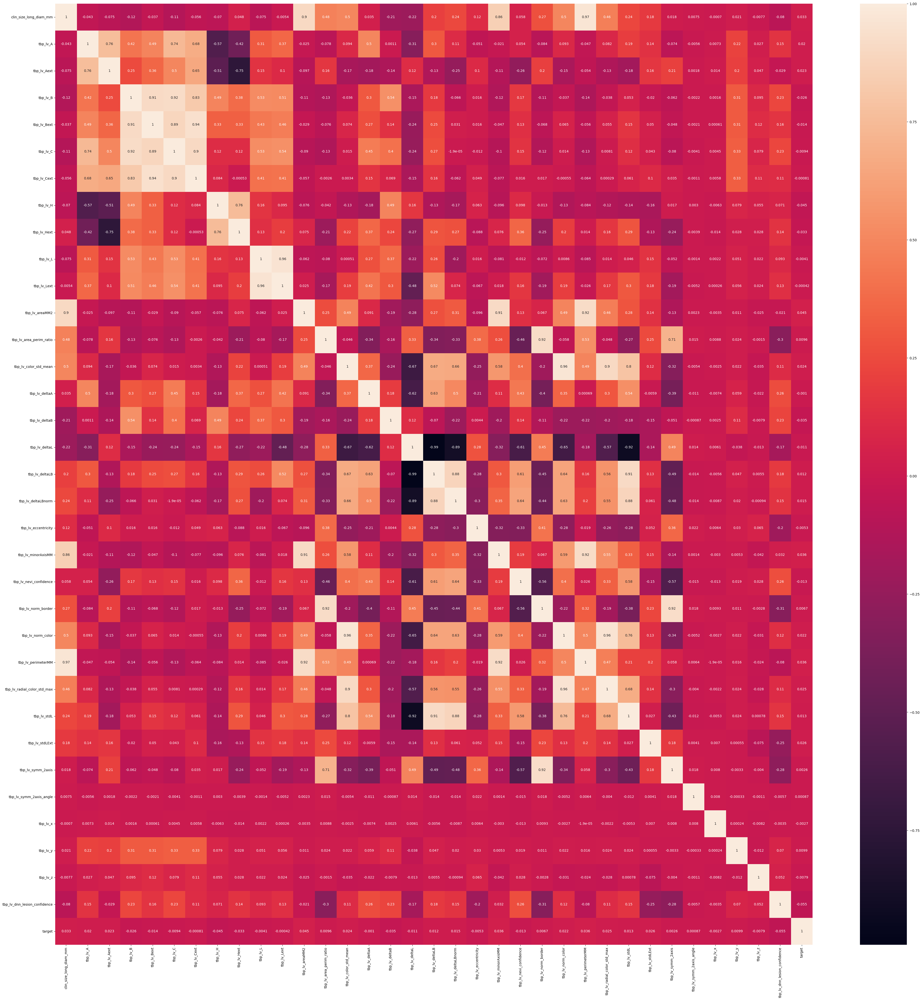

In [161]:
fig, ax=plt.subplots(1,1,figsize=(50, 50))
sns.heatmap(data_numerical.corr(method='pearson'), annot=True, ax=ax)

In [162]:
data_numerical.isnull().sum()

clin_size_long_diam_mm          0
tbp_lv_A                        0
tbp_lv_Aext                     0
tbp_lv_B                        0
tbp_lv_Bext                     0
tbp_lv_C                        0
tbp_lv_Cext                     0
tbp_lv_H                        0
tbp_lv_Hext                     0
tbp_lv_L                        0
tbp_lv_Lext                     0
tbp_lv_areaMM2                  0
tbp_lv_area_perim_ratio         0
tbp_lv_color_std_mean           0
tbp_lv_deltaA                   0
tbp_lv_deltaB                   0
tbp_lv_deltaL                   0
tbp_lv_deltaLB                  0
tbp_lv_deltaLBnorm              0
tbp_lv_eccentricity             0
tbp_lv_minorAxisMM              0
tbp_lv_nevi_confidence          0
tbp_lv_norm_border              0
tbp_lv_norm_color               0
tbp_lv_perimeterMM              0
tbp_lv_radial_color_std_max     0
tbp_lv_stdL                     0
tbp_lv_stdLExt                  0
tbp_lv_symm_2axis               0
tbp_lv_symm_2a

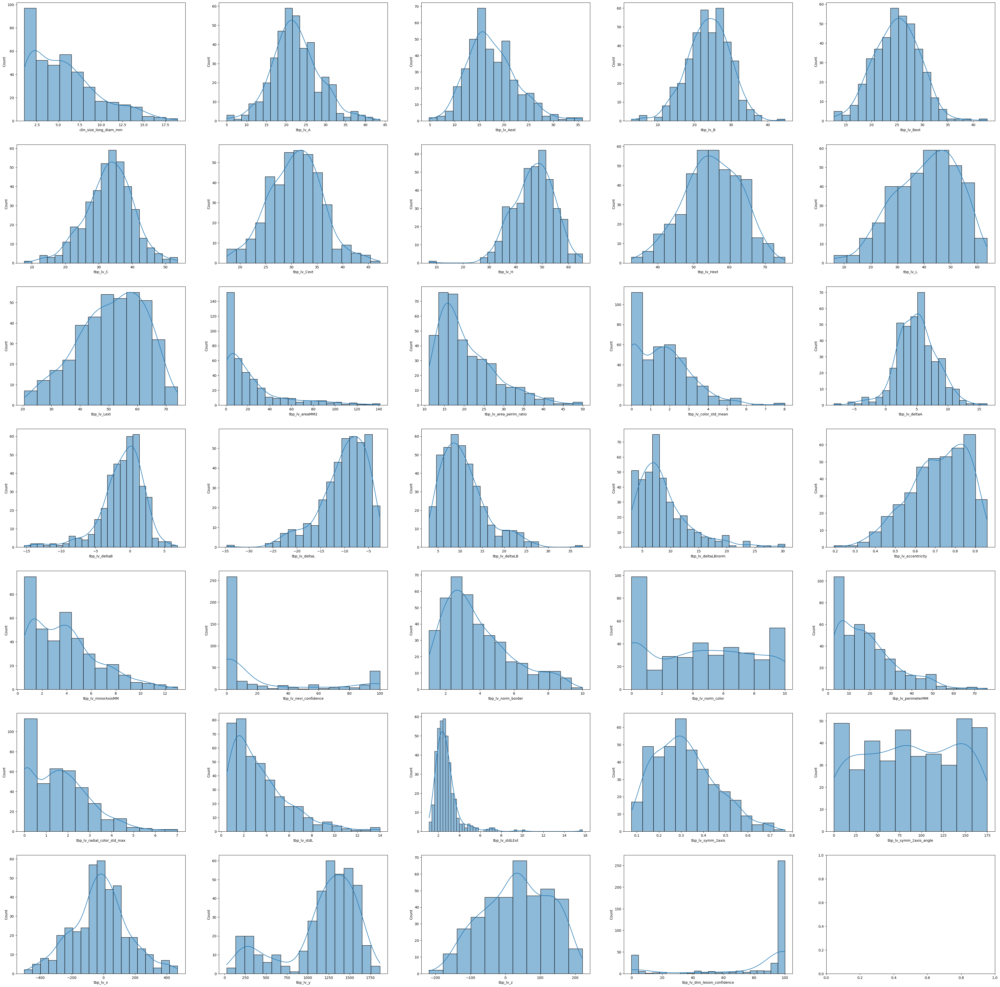

In [163]:
#col_dist=[col for col in data_numerical.columns if len(data_numerical[col].unique())<10 and col=='target']
col_dist=['mel_thick_mm']
k=0
fig, ax=plt.subplots(7, 5, figsize=(50, 50))
for i in range(7):
    for j in range(5):
        col=data_numerical.columns[k]
        if col=='target':
            k+=1
            continue
        sns.histplot(data=data_numerical.loc[data_numerical['target']==1], x=col, 
                     ax=ax[i, j], kde=True)
        k+=1
       
        

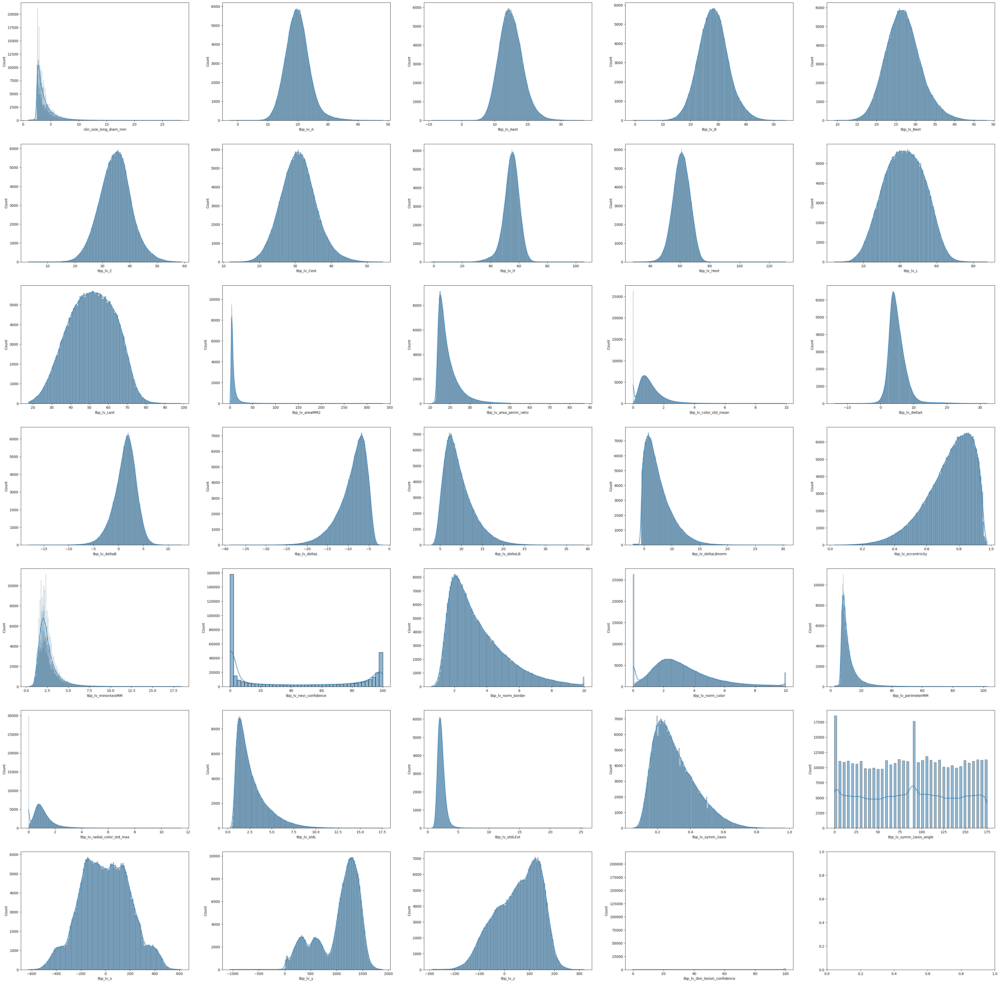

In [164]:

k=0
fig, ax=plt.subplots(7, 5, figsize=(50, 50))
for i in range(7):
    for j in range(5):
        col=data_numerical.columns[k]
        if col=='target':
            k+=1
            continue
        sns.histplot(data=data_numerical.loc[data_numerical['target']==0], x=col, 
                     ax=ax[i, j], kde=True)
        k+=1

In [165]:
data_numerical.isnull().sum()

clin_size_long_diam_mm          0
tbp_lv_A                        0
tbp_lv_Aext                     0
tbp_lv_B                        0
tbp_lv_Bext                     0
tbp_lv_C                        0
tbp_lv_Cext                     0
tbp_lv_H                        0
tbp_lv_Hext                     0
tbp_lv_L                        0
tbp_lv_Lext                     0
tbp_lv_areaMM2                  0
tbp_lv_area_perim_ratio         0
tbp_lv_color_std_mean           0
tbp_lv_deltaA                   0
tbp_lv_deltaB                   0
tbp_lv_deltaL                   0
tbp_lv_deltaLB                  0
tbp_lv_deltaLBnorm              0
tbp_lv_eccentricity             0
tbp_lv_minorAxisMM              0
tbp_lv_nevi_confidence          0
tbp_lv_norm_border              0
tbp_lv_norm_color               0
tbp_lv_perimeterMM              0
tbp_lv_radial_color_std_max     0
tbp_lv_stdL                     0
tbp_lv_stdLExt                  0
tbp_lv_symm_2axis               0
tbp_lv_symm_2a

In [ ]:
data_categorical=train_data.drop(col_numerical, axis=1)
data_categorical['target']=train_data['target']
data_categorical.shape

In [ ]:
data_categorical.isnull().sum()

In [ ]:
for col in col_categorical:
    print(f'{col}:{len(data_categorical[col].unique())}')

In [ ]:
col_dist=['iddx_1','iddx_2', 'iddx_3', 'iddx_4', 'iddx_5', 'lesion_id', 'patient_id', 'copyright_license', 
           'iddx_full', 'isic_id', 'mel_mitotic_index', 'mel_thick_mm', 'image_type']

In [ ]:
data_mod=data_categorical.drop(col_dist, axis=1)
for col in data_mod.columns:
    print(f'{col}:{dict(data_mod[col].value_counts())}')
    print(" ")
    

In [ ]:
k=0
fig, ax=plt.subplots(4, 2, figsize=(55, 55))
for i in range(4):
    for j in range(2):
        col=data_categorical.drop(col_dist, axis=1).columns[k]
        if col=='target':
            k+=1
            continue
        sns.countplot(data=data_categorical.loc[data_categorical['target']==0], x=col, ax=ax[i, j], label='Bening')
        ax[i,  j].tick_params(axis='x', labelsize=7)
        k+=1

In [ ]:
k=0
fig, ax=plt.subplots(4, 2, figsize=(55, 55))
for i in range(4):
    for j in range(2):
        col=data_categorical.drop(col_dist, axis=1).columns[k]
        if col=='target':
            k+=1
            continue
        sns.countplot(data=data_categorical.loc[data_categorical['target']==1], x=col, ax=ax[i, j])
        ax[i, j].tick_params(axis='x', labelsize=7)
        
        k+=1

In [ ]:
#Head and Neck location seems to be quite prominent as malignant positions 
#The data distribution cannot be trusted very much as there is large amount of imbalance between the categories

### Feature Engineering

In [9]:
from sklearn.metrics import roc_auc_score

In [10]:
df_train=train_data.copy()
df_test=test_data.copy()

In [11]:
COL_TO_DROP=[col for col in df_train.columns if col not in df_test and col!='target']
df_train.drop(COL_TO_DROP, axis=1, inplace=True)

In [12]:
def feature_engineering(df):
    # New features to try...
    
    err= 1e-5
    
    df["lesion_size_ratio"] = df["tbp_lv_minorAxisMM"] / df["clin_size_long_diam_mm"]
    df["lesion_shape_index"] = df["tbp_lv_areaMM2"] / (df["tbp_lv_perimeterMM"] ** 2)
    df["hue_contrast"] = (df["tbp_lv_H"] - df["tbp_lv_Hext"]).abs()
    df["luminance_contrast"] = (df["tbp_lv_L"] - df["tbp_lv_Lext"]).abs()
    df["lesion_color_difference"] = np.sqrt(df["tbp_lv_deltaA"] ** 2 + df["tbp_lv_deltaB"] ** 2 + df["tbp_lv_deltaL"] ** 2)
    df["border_complexity"] = df["tbp_lv_norm_border"] + df["tbp_lv_symm_2axis"]
    df["color_uniformity"] = df["tbp_lv_color_std_mean"] / df["tbp_lv_radial_color_std_max"]
    df["3d_position_distance"] = np.sqrt(df["tbp_lv_x"] ** 2 + df["tbp_lv_y"] ** 2 + df["tbp_lv_z"] ** 2) 
    df["perimeter_to_area_ratio"] = df["tbp_lv_perimeterMM"] / df["tbp_lv_areaMM2"]
    df["area_to_perimeter_ratio"] = df["tbp_lv_areaMM2"] / df["tbp_lv_perimeterMM"]
    df["lesion_visibility_score"] = df["tbp_lv_deltaLBnorm"] + df["tbp_lv_norm_color"]
    df["combined_anatomical_site"] = df["anatom_site_general"] + "_" + df["tbp_lv_location"]
    df["symmetry_border_consistency"] = df["tbp_lv_symm_2axis"] * df["tbp_lv_norm_border"]
    df["symmetry_border_consistency2"] = df["tbp_lv_symm_2axis"] * df["tbp_lv_norm_border"] / (df["tbp_lv_symm_2axis"] + df["tbp_lv_norm_border"])
    df["color_consistency"] = df["tbp_lv_stdL"] / df["tbp_lv_Lext"]
    df["color_consistency2"] = df["tbp_lv_stdL"] * df["tbp_lv_Lext"] / (df["tbp_lv_stdL"] + df["tbp_lv_Lext"])
    
    df["size_age_interaction"] = df["clin_size_long_diam_mm"] * df["age_approx"]
    df["hue_color_std_interaction"] = df["tbp_lv_H"] * df["tbp_lv_color_std_mean"]
    df["lesion_severity_index"] = (df["tbp_lv_norm_border"] + df["tbp_lv_norm_color"] + df["tbp_lv_eccentricity"]) / 3
    df["shape_complexity_index"] = df["border_complexity"] + df["lesion_shape_index"]
    df["color_contrast_index"] = df["tbp_lv_deltaA"] + df["tbp_lv_deltaB"] + df["tbp_lv_deltaL"] + df["tbp_lv_deltaLBnorm"]
    df["log_lesion_area"] = np.log(df["tbp_lv_areaMM2"] + 1)
    df["normalized_lesion_size"] = df["clin_size_long_diam_mm"] / df["age_approx"]
    df["mean_hue_difference"] = (df["tbp_lv_H"] + df["tbp_lv_Hext"]) / 2
    df["std_dev_contrast"] = np.sqrt((df["tbp_lv_deltaA"] ** 2 + df["tbp_lv_deltaB"] ** 2 + df["tbp_lv_deltaL"] ** 2) / 3)
    df["color_shape_composite_index"] = (df["tbp_lv_color_std_mean"] + df["tbp_lv_area_perim_ratio"] + df["tbp_lv_symm_2axis"]) / 3
    df["3d_lesion_orientation"] = np.arctan2(df_train["tbp_lv_y"], df_train["tbp_lv_x"])
    df["overall_color_difference"] = (df["tbp_lv_deltaA"] + df["tbp_lv_deltaB"] + df["tbp_lv_deltaL"]) / 3
    df["symmetry_perimeter_interaction"] = df["tbp_lv_symm_2axis"] * df["tbp_lv_perimeterMM"]
    df["comprehensive_lesion_index"] = (df["tbp_lv_area_perim_ratio"] + df["tbp_lv_eccentricity"] + df["tbp_lv_norm_color"] + df["tbp_lv_symm_2axis"]) / 4

    # Taken from: https://www.kaggle.com/code/dschettler8845/isic-detect-skin-cancer-let-s-learn-together
    
    df["color_variance_ratio"] = df["tbp_lv_color_std_mean"] / df["tbp_lv_stdLExt"]
    df["border_color_interaction"] = df["tbp_lv_norm_border"] * df["tbp_lv_norm_color"]
    df["size_color_contrast_ratio"] = df["clin_size_long_diam_mm"] / df["tbp_lv_deltaLBnorm"]
    df["age_normalized_nevi_confidence"] = df["tbp_lv_nevi_confidence"] / df["age_approx"]
    df["color_asymmetry_index"] = df["tbp_lv_radial_color_std_max"] * df["tbp_lv_symm_2axis"]
    df["3d_volume_approximation"] = df["tbp_lv_areaMM2"] * np.sqrt(df["tbp_lv_x"]**2 + df["tbp_lv_y"]**2 + df["tbp_lv_z"]**2)
    df["color_range"] = (df["tbp_lv_L"] - df["tbp_lv_Lext"]).abs() + (df["tbp_lv_A"] - df["tbp_lv_Aext"]).abs() + (df["tbp_lv_B"] - df["tbp_lv_Bext"]).abs()
    df["shape_color_consistency"] = df["tbp_lv_eccentricity"] * df["tbp_lv_color_std_mean"]
    df["border_length_ratio"] = df["tbp_lv_perimeterMM"] / (2 * np.pi * np.sqrt(df["tbp_lv_areaMM2"] / np.pi))
    df["age_size_symmetry_index"] = df["age_approx"] * df["clin_size_long_diam_mm"] * df["tbp_lv_symm_2axis"]
    df["age_size_symmetry_index2"] = df["age_approx"] * df["tbp_lv_areaMM2"] * df["tbp_lv_symm_2axis"]
    # Until here.
    
    new_num_cols = [
        "lesion_size_ratio", "lesion_shape_index", "hue_contrast",
        "luminance_contrast", "lesion_color_difference", "border_complexity",
        "color_uniformity", "3d_position_distance", "perimeter_to_area_ratio","area_to_perimeter_ratio",
        "lesion_visibility_score", "symmetry_border_consistency", "symmetry_border_consistency2", "color_consistency","color_consistency2",

        "size_age_interaction", "hue_color_std_interaction", "lesion_severity_index", 
        "shape_complexity_index", "color_contrast_index", "log_lesion_area",
        "normalized_lesion_size", "mean_hue_difference", "std_dev_contrast",
        "color_shape_composite_index", "3d_lesion_orientation", "overall_color_difference",
        "symmetry_perimeter_interaction", "comprehensive_lesion_index",
        
        "color_variance_ratio", "border_color_interaction", "size_color_contrast_ratio",
        "age_normalized_nevi_confidence", "color_asymmetry_index", "3d_volume_approximation",
        "color_range", "shape_color_consistency", "border_length_ratio", "age_size_symmetry_index","age_size_symmetry_index2",
    ]
    
    num_cols = [
    'age_approx',                        # Approximate age of patient at time of imaging.
    'clin_size_long_diam_mm',            # Maximum diameter of the lesion (mm).+
    'tbp_lv_A',                          # A inside  lesion.+
    'tbp_lv_Aext',                       # A outside lesion.+
    'tbp_lv_B',                          # B inside  lesion.+
    'tbp_lv_Bext',                       # B outside lesion.+ 
    'tbp_lv_C',                          # Chroma inside  lesion.+
    'tbp_lv_Cext',                       # Chroma outside lesion.+
    'tbp_lv_H',                          # Hue inside the lesion; calculated as the angle of A* and B* in LAB* color space. Typical values range from 25 (red) to 75 (brown).+
    'tbp_lv_Hext',                       # Hue outside lesion.+
    'tbp_lv_L',                          # L inside lesion.+
    'tbp_lv_Lext',                       # L outside lesion.+
    'tbp_lv_areaMM2',                    # Area of lesion (mm^2).+
    'tbp_lv_area_perim_ratio',           # Border jaggedness, the ratio between lesions perimeter and area. Circular lesions will have low values; irregular shaped lesions will have higher values. Values range 0-10.+
    'tbp_lv_color_std_mean',             # Color irregularity, calculated as the variance of colors within the lesion's boundary.
    'tbp_lv_deltaA',                     # Average A contrast (inside vs. outside lesion).+
    'tbp_lv_deltaB',                     # Average B contrast (inside vs. outside lesion).+
    'tbp_lv_deltaL',                     # Average L contrast (inside vs. outside lesion).+
    'tbp_lv_deltaLB',                    #
    'tbp_lv_deltaLBnorm',                # Contrast between the lesion and its immediate surrounding skin. Low contrast lesions tend to be faintly visible such as freckles; high contrast lesions tend to be those with darker pigment. Calculated as the average delta LB of the lesion relative to its immediate background in LAB* color space. Typical values range from 5.5 to 25.+
    'tbp_lv_eccentricity',               # Eccentricity.+
    'tbp_lv_minorAxisMM',                # Smallest lesion diameter (mm).+
    'tbp_lv_nevi_confidence',            # Nevus confidence score (0-100 scale) is a convolutional neural network classifier estimated probability that the lesion is a nevus. The neural network was trained on approximately 57,000 lesions that were classified and labeled by a dermatologist.+,++
    'tbp_lv_norm_border',                # Border irregularity (0-10 scale); the normalized average of border jaggedness and asymmetry.+
    'tbp_lv_norm_color',                 # Color variation (0-10 scale); the normalized average of color asymmetry and color irregularity.+
    'tbp_lv_perimeterMM',                # Perimeter of lesion (mm).+
    'tbp_lv_radial_color_std_max',       # Color asymmetry, a measure of asymmetry of the spatial distribution of color within the lesion. This score is calculated by looking at the average standard deviation in LAB* color space within concentric rings originating from the lesion center. Values range 0-10.+
    'tbp_lv_stdL',                       # Standard deviation of L inside  lesion.+
    'tbp_lv_stdLExt',                    # Standard deviation of L outside lesion.+
    'tbp_lv_symm_2axis',                 # Border asymmetry; a measure of asymmetry of the lesion's contour about an axis perpendicular to the lesion's most symmetric axis. Lesions with two axes of symmetry will therefore have low scores (more symmetric), while lesions with only one or zero axes of symmetry will have higher scores (less symmetric). This score is calculated by comparing opposite halves of the lesion contour over many degrees of rotation. The angle where the halves are most similar identifies the principal axis of symmetry, while the second axis of symmetry is perpendicular to the principal axis. Border asymmetry is reported as the asymmetry value about this second axis. Values range 0-10.+
    'tbp_lv_symm_2axis_angle',           # Lesion border asymmetry angle.+
    'tbp_lv_x',                          # X-coordinate of the lesion on 3D TBP.+
    'tbp_lv_y',                          # Y-coordinate of the lesion on 3D TBP.+
    'tbp_lv_z',                          # Z-coordinate of the lesion on 3D TBP.+
]

    new_cat_cols = ["combined_anatomical_site"]
    
    for col in num_cols+new_num_cols:
        group_mean = df.groupby('patient_id')[col].transform('mean')
        group_std = df.groupby('patient_id')[col].transform('std').fillna(0)

        df[f'{col}_patient_norm'] = (df[col] - group_mean) / (group_std + err)
    
    df['patient_count'] = df.groupby('patient_id')['isic_id'].transform('count')
    return [df, new_num_cols, new_cat_cols]

In [13]:
df_train, new_num_cols, new_cat_cols=feature_engineering(df_train)
df_test, _, _ = feature_engineering(df_test)

In [15]:
dnn_pred_train=np.where(df_train['tbp_lv_nevi_confidence']>30, 0, 1)
dnn_pred_test=np.where(df_test['tbp_lv_nevi_confidence']>30, 0, 1)

In [16]:
target=df_train['target']
roc_score=roc_auc_score(target, dnn_pred_train, average='macro')
print(f'roc_score:{roc_score}')

roc_score:0.6032585770138013


In [17]:
# df_train['nevius_pred'] = dnn_pred_train
# df_test['nevius_pred'] = dnn_pred_test

In [18]:
# plt.figure(figsize=(30, 30))
# sns.heatmap(df_train.isnull(), cmap='viridis', cbar=True, yticklabels=True)

In [19]:
df_train.drop(['copyright_license','image_type', 'tbp_tile_type'], axis=1, inplace=True)
df_test.drop(['copyright_license','image_type', 'tbp_tile_type'], axis=1, inplace=True)

In [20]:
# for col in df_train.columns:
#     print(f'{col}:{len(df_train[col].unique())}')

In [21]:
def add_image_predictions(df, Type = None):
    if Type=='train':
        df_eff = pd.read_csv('/kaggle/input/isic-inference-effnetv1b0-for-training-data/train_effnetv1b0.csv')
        df['target_effnetv1b0']= df_eff['target_effnetv1b0']
        
        df_eva = pd.read_csv('/kaggle/input/isic-inference-eva02-for-training-data/train_eva02.csv')
        df['target_eva02'] = df_eva['target_eva02']
        
        df_edge =  pd.read_csv('/kaggle/input/isic-inference-edgenext-for-training-data/train_edgenext.csv')
        df['target_edgenext']  = df_edge['target_edgenext']
        
        df_target3 = pd.read_csv('/kaggle/input/isic-2024-pl-submission-script-and-preds/train_preds.csv') 
        df['target3'] = df_target3['pred']
        
    else:
        
        df_eff = pd.read_csv('/kaggle/working/submission_effnetv1b0.csv')
        df['target_effnetv1b0'] = df_eff['target']
        
        df_eva = pd.read_csv('/kaggle/working/submission_eva02.csv')
        df['target_eva02'] = df_eva['target']
        
        df_edge = pd.read_csv('/kaggle/working/submission_edgenext.csv')
        df['target_edgenext'] = df_edge['target'] 
         
        df_target3 = pd.read_csv('/kaggle/working/submission_image3.csv') 
        df['target3'] = df_target3['target']
        
    return df

In [22]:
df_train = add_image_predictions(df_train,Type='train')
df_test = add_image_predictions(df_test,Type='test')

In [23]:
image_preds=['target_effnetv1b0', 'target_eva02', 'target_edgenext', 'target3']

In [24]:
# #Dropping null rows if they belong to majority class
# cols = df_train.columns[df_train.isnull().any()].tolist()
# ids  = []
# for col in cols:
#     benign_null_smaples=df_train[df_train['target']==0].loc[df_train[col].isnull()]
#     ids.append(benign_null_smaples.index)
#     print(f"{col}:{benign_null_smaples.shape[0]}")
# ids=[i for row in ids for i in row]
# df_train.drop(ids, inplace=True)
# df_train=df_train.reset_index()
# df_train.drop(['index'], axis=1, inplace=True)
    

In [25]:
df_train.replace([np.inf, -np.inf], np.nan, inplace = True)
df_test.replace([np.inf, -np.inf], np.nan, inplace = True)

In [26]:
#Building the feature engineering pipeline
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_is_fitted

In [27]:
# class ClassFrequencyEncoder(BaseEstimator, TransformerMixin):
#     def __init__(self):
#         self.frequency_dict_pos = {}
#         self.frequency_dict_neg = {}

#     def fit(self, X, y=None):
#         for col in X.columns:
#             if col=='target':continue
#             frequency_pos = X.loc[X['target']==1,col].value_counts().to_dict()
#             frequency_neg = X.loc[X['target']==0,col].value_counts().to_dict()
#             self.frequency_dict_pos[col] = frequency_pos
#             self.frequency_dict_neg[col] = frequency_neg
#         return self

#     def transform(self, X):
#         for col in X.columns:
#             if col == 'target':
#                 continue
#             pos_map = X[col].map(self.frequency_dict_pos[col])
#             neg_map = X[col].map(self.frequency_dict_neg[col])
#             X[col] = np.where(X['target'] == 1, pos_map, neg_map)
#         return X


In [28]:
class HashEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.feature_values={}
    
    def fit(self, X, y=None):
        for col in X.columns:
            if col=='isic_id':continue
            encoded_values = self.hash_encode(X[col], 10)
            self.feature_values[col]=encoded_values
        
        return self
            

    def hash_encode(self, features, num_bins):
        features = features.astype(str)
        encoded_values = np.array([hash(value) % num_bins for value in features])

        return encoded_values
    
    def transform(self, X):
        for col in X.columns:
            if col=='isic_id':continue
            X[col]=self.feature_values[col]
        
        return X


In [29]:
def create_pipeline(col_impute, col_numerical, col_high_dim):

    high_dim_pipeline = Pipeline(steps=[
            ('hash_encoder', HashEncoder()),
            ('scaler', MinMaxScaler())
        ])

    numerical_pipeline = Pipeline(steps=[('scaler', MinMaxScaler())])

    preprocessor = ColumnTransformer(
            transformers=[
                ('high_dim_categorical', high_dim_pipeline, col_high_dim),
                ('numerical', MinMaxScaler(), col_numerical)
            ]
        )

    pipeline = Pipeline(steps=[('preprocess', preprocessor),
                              ('Imputation', SimpleImputer(strategy='median'))])
    return pipeline

In [30]:
def pre_processing_pipeline(df, col_impute, col_numerical, col_high_dim):
    
    pipeline=create_pipeline(col_impute, col_numerical, col_high_dim)
    
    transformed = pipeline.fit_transform(df)
    preprocessor = pipeline.named_steps['preprocess']
   
   
    high_dim_encoder = preprocessor.named_transformers_['high_dim_categorical'].named_steps['hash_encoder']

    high_dim_feature_names = col_high_dim

    all_feature_names = high_dim_feature_names + col_numerical
    df_transformed = pd.DataFrame(transformed, columns = all_feature_names)
    
    return df_transformed

In [31]:
col_impute=df_train.columns[df_train.isnull().any()].tolist()
col_numerical=[col for col in df_train.columns if df_train[col].dtype!='object' and col not in image_preds]
col_high_dim=[col for col in df_train.columns if df_train[col].dtype=='object' and len(df_train[col].unique())>10 and col not in ['isic_id', 'patient_id']]
col_low_dim=[col for col in df_train.columns if df_train[col].dtype=='object' and len(df_train[col].unique())<10 and col not in ['isic_id', 'patient_id']]

In [32]:
col_numerical_test=col_numerical.copy()
col_numerical_test.remove('target')

In [33]:
df_trans_train=pre_processing_pipeline(df_train, col_impute, col_numerical, col_high_dim)
df_trans_test=pre_processing_pipeline(df_test, col_impute, col_numerical_test, col_high_dim)

In [34]:
encoder = OneHotEncoder(sparse_output=False, dtype=np.int32, handle_unknown='ignore')
encoder.fit(df_train[col_low_dim])
    
new_cat_cols = [f'onehot_{i}' for i in range(len(encoder.get_feature_names_out()))]

df_trans_train[new_cat_cols] = encoder.transform(df_train[col_low_dim])
df_trans_train[new_cat_cols] = df_trans_train[new_cat_cols].astype('category')

df_trans_test[new_cat_cols] = encoder.transform(df_test[col_low_dim])
df_trans_test[new_cat_cols] = df_trans_test[new_cat_cols].astype('category')


In [35]:
df_trans_test.shape

(3, 175)

In [36]:
for preds in image_preds:
    df_trans_train[preds]=df_train[preds]
    df_trans_test[preds]=df_test[preds]

In [36]:
x=df_trans_train.copy()
x['target']=df_train['target']

### Feature Selection

In [95]:
from sklearn.feature_selection import VarianceThreshold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import mutual_info_classif

In [33]:
variance=pd.DataFrame(df_trans_train.var(numeric_only=True), columns=['Variance'])

In [34]:
variance.loc[variance['Variance']<0.00001]

,Variance
color_uniformity,0.000009


In [32]:
def calc_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'].round(2)
    return(vif)

In [ ]:
VIF =  calc_vif(df_trans_train)
VIF["VIF"].replace([np.inf, -np.inf], np.nan, inplace=True)
VIF_filtered = VIF.dropna(subset=["VIF"])
VIF_sorted = VIF_filtered.sort_values(by="VIF", ascending=False)

In [70]:
def drop_highly_correlated(df, threshold=0.5, no_drop=None):
    corr_mat = df.corr()
    
    correlated_vars = set()
    for col in corr_mat.columns:
        if col in no_drop:continue
        if col not in correlated_vars:
            high_corr_vars = corr_mat.index[(abs(corr_mat[col]) > threshold) & (abs(corr_mat[col]) < 1)]
            correlated_vars.update(high_corr_vars)

    to_drop = set()
    for var in correlated_vars:
        if var not in to_drop:
            correlated = corr_mat.index[(abs(corr_mat[var]) > threshold) & (abs(corr_mat[var]) < 1)]
            correlated = correlated[correlated != var]  
            to_drop.update(correlated)
 
    df_reduced = df.drop(columns=list(to_drop))
    
    return df_reduced

In [72]:
df_trans_train = drop_highly_correlated(df_trans_train, threshold=0.95, no_drop=new_num_cols+new_cat_cols)

In [73]:
highly_correlated_cols=[col for col in df_trans_test if col not in df_trans_train]
df_trans_test.drop(highly_correlated_cols, axis=1, inplace=True)

In [74]:
df_trans_train.shape

(401059, 132)

[]

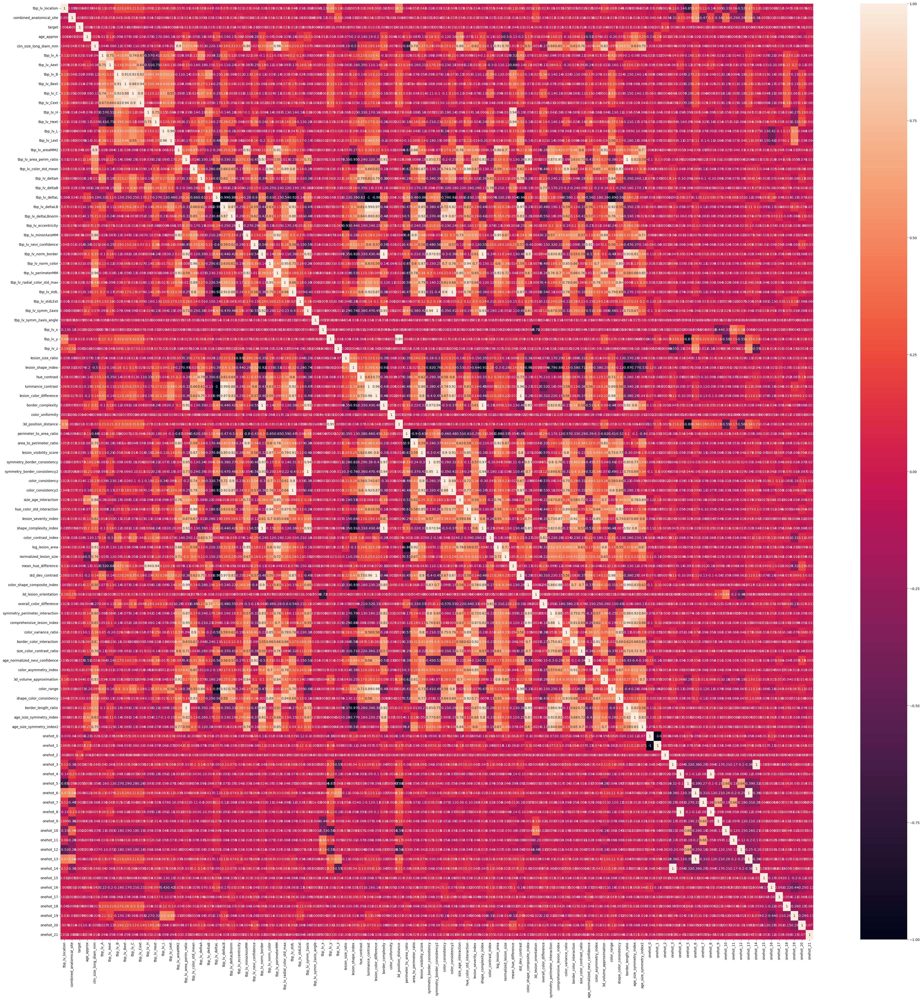

In [230]:
fig, ax=plt.subplots(1,1,figsize=(50, 50))
sns.heatmap(df_trans_train.corr(method='pearson'), annot=True, ax=ax)
plt.plot()

In [ ]:
df_transformed[df_transformed['target_1']==1]

In [28]:
Importance = mutual_info_classif(df_trans_train.drop(['target'], axis=1), df_trans_train['target'])
cols = df_trans_train.columns.to_list()
cols.remove('target')
data_importance = {
    'variables' : cols,
    'importance_score': Importance
}

data_importance = pd.DataFrame(data_importance)
plt.figure(figsize=(40, 6))
sns.barplot(y='variables', x='importance_score', data=data_importance)

plt.title('Mutual Information')
plt.xlabel('Varibales')
plt.ylabel('Importance')

plt.show()


In [29]:
variables_low_imp = data_importance.loc[data_importance['importance_score']<0.0005]['variables']\
.to_list()
variables_low_imp.remove('onehot_2')
variables_low_imp.remove('onehot_17')

In [30]:
variables_low_imp

['tbp_lv_A',
 'tbp_lv_Aext',
 'tbp_lv_B',
 'tbp_lv_Bext',
 'tbp_lv_C',
 'tbp_lv_Cext',
 'tbp_lv_L',
 'tbp_lv_Lext',
 'tbp_lv_deltaA',
 'tbp_lv_deltaL',
 'tbp_lv_deltaLB',
 'tbp_lv_eccentricity',
 'tbp_lv_nevi_confidence',
 'tbp_lv_norm_border',
 'tbp_lv_stdL',
 'tbp_lv_stdLExt',
 'tbp_lv_symm_2axis',
 'tbp_lv_x',
 'tbp_lv_y',
 'tbp_lv_z',
 'lesion_size_ratio',
 'hue_contrast',
 'luminance_contrast',
 'lesion_color_difference',
 'border_complexity',
 '3d_position_distance',
 'symmetry_border_consistency',
 'symmetry_border_consistency2',
 'color_consistency',
 'color_consistency2',
 'shape_complexity_index',
 'color_contrast_index',
 'std_dev_contrast',
 '3d_lesion_orientation',
 'overall_color_difference',
 'symmetry_perimeter_interaction',
 'size_color_contrast_ratio',
 'age_normalized_nevi_confidence',
 'color_range',
 'age_size_symmetry_index']

In [31]:
df_trans_train.drop(variables_low_imp, axis=1, inplace=True)
df_trans_test.drop(variables_low_imp, axis=1, inplace=True)

In [32]:
# df_trans_train.to_csv('data_transformed.csv', index=False)

In [33]:
df_trans_train.shape

(357174, 59)

In [34]:
df_trans_test.shape

(3, 58)

## Image based Approach

### Curing Image Data

In [37]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence

2024-09-01 19:59:10.393666: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-01 19:59:10.393782: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-01 19:59:10.514708: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
positive = df_train.loc[df_train['target']==1, 'isic_id']
negative = df_train.loc[df_train['target']==0, 'isic_id']

image_data = list(positive)

image_data.extend(negative[:(1000 -len(positive))])

In [ ]:
def avg_hashing(image_path, hashing_size=8):
    """
    Description: This function convert an image into a binary string based on if the pixel value is greater
    or smaller than the average pixel value
    
    Input: Image path, hashing_size
    
    Output: Image bits 
    
    """ 
    img=cv.imread(image_path)
    
    resized_image= cv.resize(img,(hashing_size,hashing_size))
    
    grayscale = cv.cvtColor(resized_image, cv.COLOR_BGR2GRAY)  # Convert to grayscale
    
    avg_pixel = np.mean(grayscale) #get average pixel value 
    
    bits = "".join(map(lambda pixel: '1' if pixel < avg_pixel else '0', grayscale.flatten()))
    
    return int(bits, 2)

In [ ]:
#Calculating the hamming distance
def hamming_distance(hash1, hash2):
    """
    Description: Calculates the hamming distance inbetween our hashes
    
    Input: Hash1 and Hash2
    
    Output: Hamming distance between the hashes
    """
    return bin(hash1 ^ hash2).count('1')

In [ ]:
threshold=9 #threshold value for hamming distance for similarity measurement 
duplicates = []
hash_container = {}

for image in image_data:
    image = image+'.jpg'
    image_path=os.path.join(img_dir, image)
   
    image_hash_val = avg_hashing(image_path)
    similar_image = None

    for hash_val, path in hash_container.items():
        if hamming_distance(hash_val, image_hash_val) < threshold:
            similar_image = path
            break

    if similar_image:
        duplicates.append((image_path, similar_image))
    else:
        hash_container[image_hash_val] = image_path

In [ ]:
fig, ax= plt.subplots(2, 4, figsize=(30,20))
idx = 0
for i in range(2):
    for j, similar_images in enumerate(duplicates[idx:idx+4]):
        img1=cv.imread(similar_images[0])
        img2=cv.imread(similar_images[1])

        img1=cv.cvtColor(img1, cv.COLOR_BGR2RGB)
        img2=cv.cvtColor(img2, cv.COLOR_BGR2RGB)

        img1=cv.resize(img1, (150,150))
        img2=cv.resize(img2, (150,150))

        stacked=np.hstack((np.array(img1),np.array(img2)))

        img1_name=os.path.basename(similar_images[0])
        img2_name=os.path.basename(similar_images[1])

        ax[i][j].imshow(stacked)
        ax[i][j].set_xlabel(f"IDS:{(img1_name,img2_name)}")
    idx+=4

In [ ]:
img_dataframe = []
for image in image_data:
    image = image+'.jpg'
    image_path=os.path.join(img_dir, image)
    img_dataframe.append(image_path)
    
img_dataframe = pd.DataFrame(img_dataframe, columns = ['image_paths'])

In [ ]:
img_dataframe.shape

### Model Building

In [38]:
from tensorflow.keras.layers import Input, Dense, Dropout, CenterCrop, Conv2D, Flatten, MaxPool2D, Dense, Concatenate,GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import KFold,StratifiedKFold
from tensorflow.keras.applications import EfficientNetV2B1
from sklearn.metrics import confusion_matrix
from PIL import Image
import h5py
import io

In [55]:
#meta_data = pd.read_csv('/kaggle/input/isic-meta-data/data_transformed.csv')
meta_data=df_trans_train.copy()

In [56]:
meta_data['isic_id']=df_train['isic_id']
meta_data['patient_id']=df_train['patient_id']

In [57]:
meta_data['patient_id'].isnull().sum()

0

In [58]:
def cnn_model(inputs):
    x = Conv2D(filters = 32, kernel_size = 2)(inputs)
    x = MaxPool2D(strides = 2)(x)
    x = Dropout(0.2)(x)
    x = Flatten()(x)
    
    return x 

In [59]:
negative_exps=meta_data.loc[meta_data['target']==1]
positive_exps=meta_data.loc[meta_data['target']==0].sample(frac=0.04, random_state=42)
filtered_meta_data=pd.concat([negative_exps, positive_exps])

In [ ]:
filtered_meta_data = filtered_meta_data.reset_index()
filtered_meta_data.drop(['index'], axis=1, inplace=True)
filtered_meta_data = filtered_meta_data.sample(frac=1).reset_index(drop=True)

In [ ]:
filtered_meta_data.shape

In [ ]:
filtered_meta_data.head()

In [ ]:
meta_tensor = filtered_meta_data.drop(['isic_id', 'target', 'patient_id'], axis=1)

In [ ]:
meta_tensor.shape

In [ ]:
batch_size=32
target_size =(384, 384)

In [ ]:
def build_model(image_input_shape, meta_tensor):

    tabular_input = Input(shape=(meta_tensor.shape[1],), batch_size=batch_size, name='tabular_input')
    image_input = Input(shape=image_input_shape, batch_size=batch_size, name='image_input')

    base_model = EfficientNetV2B1(include_top=False,  weights='imagenet', input_shape=image_input_shape)
    for layer in base_model.layers:
        layer.trainable = False
        
    x = base_model(image_input)
    #x = Flatten()(x)
    x=GlobalAveragePooling2D()(x)
#     #concatenated = Concatenate()([x, tabular_input])

#     x = Dense(64, activation='relu')(x)
    output = Dense(1, activation='sigmoid')(x)  

    #model = Model(inputs=[image_input, tabular_input], outputs=output)
    model = Model(inputs=[image_input], outputs=output)
    return model

In [ ]:
model = build_model((*target_size, 3), meta_tensor)

In [ ]:
model.summary()

In [ ]:
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

### Define Data Generator and Metric

In [ ]:
def custom_metric(y_hat, y_true):
    min_tpr = 0.80
    max_fpr = abs(1 - min_tpr)
    
    v_gt = abs(y_true - 1)
    v_pred = np.array([1.0 - x for x in y_hat])
    
    partial_auc_scaled = roc_auc_score(v_gt, v_pred, max_fpr=max_fpr)
    partial_auc = 0.5 * max_fpr**2 + (max_fpr - 0.5 * max_fpr**2) / (1.0 - 0.5) * (partial_auc_scaled - 0.5)
    
    return partial_auc

In [ ]:
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, hdf5_file, image_ids, tabular_df, batch_size, labels=None,
                 image_size=(150, 150), crop_size=(64, 64), image_augmentor=None, shuffle=True, center_crop=False):
        super().__init__()
        self.hdf5_file = h5py.File(hdf5_file, 'r')
        self.image_ids = image_ids
        self.tabular_df = tabular_df
        self.labels = labels
        self.batch_size = batch_size
        self.image_size = image_size
        self.crop_size = crop_size
        self.center_crop=center_crop
        self.image_augmentor = image_augmentor
        self.shuffle = shuffle
        self.indices = np.arange(len(self.image_ids))

    def __len__(self):
        return int(np.ceil(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
    
        indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_image_ids = self.image_ids.iloc[indices]
        
        images = self._load_and_preprocess_images(batch_image_ids)
        
        
        
        if self.labels is not None and self.tabular_df is not None:
            batch_labels = self.labels.iloc[indices].values
            batch_tabular_df = self.tabular_df.iloc[indices]
            tabular_data = batch_tabular_df.values
            
            return {
                'image_input': np.array(images),
                'tabular_input': np.array(tabular_data)
            }, np.array(batch_labels)
        
        elif self.tabular_df is not None:
            batch_tabular_df = self.tabular_df.iloc[indices]
            tabular_data = batch_tabular_df.values
            
            return {
                'image_input': np.array(images),
                'tabular_input': np.array(tabular_data)
            }
        elif self.labels is not None:
            batch_labels = self.labels.iloc[indices].values
        
            return {
                'image_input': np.array(images)
            }, np.array(batch_labels)
        
        else:
            return {
                'image_input': np.array(images)
            }
            
    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

    def _load_and_preprocess_images(self, batch_image_ids):
        image_batch = np.zeros((len(batch_image_ids), *self.image_size, 3))
        
        for i, image_id in enumerate(batch_image_ids):
            
            img_bytes = self.hdf5_file[image_id][()]
            img = Image.open(io.BytesIO(img_bytes))
            img = np.array(img)
            
            if self.center_crop:
                crop_h, crop_w = self.crop_size
                h, w, _ = img.shape
                start_x = (w - crop_w) // 2
                start_y = (h - crop_h) // 2
                img = img[start_y:start_y + crop_h, start_x:start_x + crop_w]

            img = Image.fromarray(img.astype('uint8')).resize(self.image_size)
            img = np.array(img)
            #img = tf.keras.preprocessing.image.img_to_array(img)
            image_batch[i] = img
            
        if self.image_augmentor:
            image_batch_generator = self.image_augmentor.flow(image_batch, batch_size=self.batch_size, shuffle=False)
            return next(image_batch_generator)
        else:
            return image_batch

    def __del__(self):
        self.hdf5_file.close()

In [ ]:
data_augmentor= ImageDataGenerator( rescale=1./255,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    rotation_range = 10,
                                    zoom_range = (0.9, 1.1))

data_generator=CustomDataGenerator(hdf5_file=train_hdf5, 
                                   image_ids= filtered_meta_data['isic_id'], 
                                   tabular_df=None, 
                                   batch_size=batch_size, 
                                   labels=filtered_meta_data['target'] ,
                                   image_size=target_size, 
                                   crop_size=(64, 64), 
                                   center_crop=False,
                                   image_augmentor=None,
                                   shuffle=True)

In [ ]:
#Visualizing images from the data generator
rows, cols = 4, 8
border_width = 5
height, width = target_size
fig, ax = plt.subplots(rows, cols, figsize=(40, 40))

k = 0
for i in range(rows):
    for j in range(cols):
        image = data_generator.__getitem__(0)[0]['image_input'][k]
        label = data_generator.__getitem__(0)[1][k]
   
        ax[i][j].imshow(image.astype('uint8'))
       
        border_color = 'red' if label == 1 else 'green'
        
        rect = plt.Rectangle((0, 0), width, height,
                             linewidth=border_width,
                             edgecolor=border_color,
                             facecolor='none',
                             transform=ax[i][j].transData)
        ax[i][j].add_patch(rect)

        k += 1

plt.show()


### Model Training and CV

In [91]:
#Function to find optimum threshold for metric computation
def optimize_threshold(y_true, y_pred):
    thresholds=np.arange(start=0, stop=0.8, step=0.05)
    metric_values=[]
    for threshold in thresholds:
        prediction=[1 if pred>threshold else 0 for pred in y_pred]
        metric=custom_metric(prediction, y_true)
        metric_values.append(metric)
    
    ind=metric_values.index(max(metric_values))
    print(f'Max score of {max(metric_values)} attained at:{thresholds[ind]}')
    return [max(metric_values), thresholds[ind]]

In [37]:
#Define training paramters
auc_metric = tf.keras.metrics.AUC(name='auc_roc')

initial_learning_rate = 1e-4
decay_steps = 250
alpha = 1e-2  

cosine_annealing = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=decay_steps,
    alpha=alpha
)

In [ ]:
#For Image and Tabular Data
skf = StratifiedKFold(n_splits=5, shuffle=False)  
results, thresholds=[], []
fold_no = 1
for i, (train_index, val_index) in enumerate(skf.split(meta_tensor, filtered_meta_data['target'], groups=filtered_meta_data['patient_id'])):
    X_train, X_val = meta_tensor.iloc[train_index], meta_tensor.iloc[val_index]
    y_train, y_val = filtered_meta_data['target'].iloc[train_index], filtered_meta_data['target'].iloc[val_index]
    X_train_ids, X_val_ids = filtered_meta_data['isic_id'].iloc[train_index], filtered_meta_data['isic_id'].iloc[val_index]
  
#     y_train_one_hot = pd.get_dummies(y_train['target'])
#     y_val_one_hot = pd.get_dummies(y_val['target'])
   
    train_generator=CustomDataGenerator(hdf5_file=train_hdf5, 
                                   image_ids=X_train_ids, 
                                   tabular_df=None, 
                                   batch_size=batch_size, 
                                   labels=y_train ,
                                   image_size=target_size, 
                                   crop_size=(64, 64), 
                                   center_crop=False,
                                   image_augmentor=data_augmentor,
                                   shuffle=True)
    
    val_generator=CustomDataGenerator(hdf5_file=train_hdf5, 
                                   image_ids=X_val_ids, 
                                   tabular_df=None, 
                                   batch_size=batch_size, 
                                   labels=y_val,
                                   image_size=target_size, 
                                   crop_size=(64, 64), 
                                   center_crop=False,
                                   image_augmentor=None,
                                   shuffle=False)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=cosine_annealing), 
                  loss='binary_crossentropy',
                  metrics=[auc_metric])
    
    history = model.fit(train_generator,
                        epochs=1,  
                        validation_data=val_generator,
                        verbose=1)
    
    y_pred=model.predict(val_generator)
    #y_pred=[float(np.argmax(pred)) for pred in y_pred]
    
    
    y_val=val_generator.labels
    y_val=y_val.astype('int')
    #y_val = list(y_val.idxmax(axis=1))
   
    
    partial_auc_tpr, threshold = optimize_threshold(np.array(y_val), np.array(y_pred))
    results.append(partial_auc_tpr)
    thresholds.append(threshold)
    #print(f"Fold {fold_no} - Partial_AUC-{partial_auc_tpr}")
    fold_no += 1

results=np.array(results)
avg_partial_auc = np.mean([result for result in results])
print(f"Average Partial AUC-{avg_partial_auc}")

thresholds=np.array(thresholds)
avg_threshold = np.mean([threshold for threshold in thresholds])
print(f"Average Threshold-{avg_threshold}")



In [ ]:
y_pred=model.predict(val_generator)
    
y_val=val_generator.labels
y_val=y_val.astype('int')

In [ ]:
max_score, threshold=optimize_threshold(y_val, y_pred)
y_pred=[1 if pred>=threshold else 0 for pred in y_pred]

In [ ]:
cm = confusion_matrix(y_val, y_pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.show()


In [ ]:
fpr_valid, tpr_valid, thresholds_valid = roc_curve(y_val, y_pred, drop_intermediate=False)
plt.plot(fpr_valid, tpr_valid, color="red", label="valid")
plt.plot([0, 1], [0.8, 0.8], color="green", label="tpr=0.8")
plt.xlabel('FPR: False positive rate')
plt.ylabel('TPR: True positive rate')
plt.xlim(0, 1.02)
plt.ylim(0, 1.02)
plt.grid()
plt.legend()
plt.show()

In [ ]:
data_gen=CustomDataGenerator(hdf5_file=train_hdf5, 
                                   image_ids=filtered_meta_data['isic_id'], 
                                   tabular_df=None, 
                                   batch_size=batch_size, 
                                   labels=filtered_meta_data['target'],
                                   image_size=target_size, 
                                   crop_size=(64, 64), 
                                   center_crop=False,
                                   image_augmentor=data_augmentor,
                                   shuffle=True)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=cosine_annealing), 
                  loss='binary_crossentropy',
                  metrics=[auc_metric])

In [ ]:
history = model.fit(data_gen ,epochs=5, verbose=1)

In [ ]:
model.save("isic_model.h5")

In [ ]:
model=tf.keras.models.load_model('/kaggle/input/isic_model/tensorflow2/default/6/isic_model (1).h5')

In [ ]:
test_generator=CustomDataGenerator(hdf5_file=test_hdf5, 
                                   image_ids=filtered_meta_data['isic_id'], 
                                   tabular_df=None, 
                                   batch_size=batch_size, 
                                   labels=filtered_meta_data['target'],
                                   image_size=target_size, 
                                   crop_size=(64, 64), 
                                   center_crop=False,
                                   image_augmentor=data_augmentor,
                                   shuffle=True)

In [ ]:
predictions=model.predict(test_generator)

In [ ]:
predictions=[np.argmax(pred) for pred in predictions]
    
true_val=test_generator.labels
true_val=true_val.astype('int')
true_val = list(true_val.idxmax(axis=1))
    
partial_auc_tpr = custom_metric(np.array(predictions), np.array(true_val))
partial_auc_tpr

In [ ]:
predictions=[np.argmax(prediction) for prediction in predictions]

In [ ]:
submission = pd.DataFrame(test_data['isic_id'].values, columns=['isic_id'])

In [ ]:
submission['target']=predictions

In [ ]:
submission

In [ ]:
submission.to_csv('submission.csv', index=False)

# Predictive Analysis

In [37]:
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import KFold,StratifiedKFold, StratifiedShuffleSplit
from imblearn.under_sampling import RandomUnderSampler 
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier,StackingClassifier
from sklearn.model_selection import cross_validate, train_test_split,StratifiedKFold
from sklearn.metrics import roc_auc_score,classification_report
from sklearn import metrics
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from statistics import mean
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix
#from optuna.integration import LightGBMPruningCallback
import optuna

#Boosting models
import xgboost as XGB
import lightgbm as LGBM
import catboost as CBC

In [38]:
def custom_metric(y_true, y_hat):
    
    min_tpr = 0.80
    max_fpr = abs(1 - min_tpr)
    
    v_gt = abs(y_true - 1)
    v_pred = np.array([1.0 - x for x in y_hat])
    
    partial_auc_scaled = roc_auc_score(v_gt, v_pred, max_fpr=max_fpr)
    partial_auc = 0.5 * max_fpr**2 + (max_fpr - 0.5 * max_fpr**2) / (1.0 - 0.5) * (partial_auc_scaled - 0.5)
    
    return 'custom_metric', partial_auc, True

In [39]:
#Function to find optimum threshold for metric computation
def optimize_threshold(y_true, y_pred):
    thresholds=np.arange(start=0, stop=0.8, step=0.05)
    metric_values=[]
    for threshold in thresholds:
        prediction=[1 if pred>threshold else 0 for pred in y_pred]
        _, metric, _= custom_metric(y_true, y_pred)
        metric_values.append(metric)
    
    ind=metric_values.index(max(metric_values))
    print(f'Max score of {max(metric_values)} attained at:{thresholds[ind]}')
    return [max(metric_values), thresholds[ind]]

In [40]:
class SelectColumns(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.columns]

In [1]:
rus=RandomUnderSampler(sampling_strategy=0.01, random_state=42)

NameError: name 'RandomUnderSampler' is not defined

In [42]:
meta_data = df_trans_train.copy()
meta_data['isic_id']=df_train['isic_id']
meta_data['patient_id']=df_train['patient_id']

In [43]:
meta_data

,tbp_lv_location,combined_anatomical_site,target,age_approx,clin_size_long_diam_mm,tbp_lv_A,tbp_lv_Aext,tbp_lv_B,tbp_lv_Bext,tbp_lv_C,...,onehot_20,onehot_21,onehot_22,onehot_23,target_effnetv1b0,target_eva02,target_edgenext,target3,isic_id,patient_id
0,0.555556,0.444444,0.0,0.6875,0.074453,0.448560,0.549700,0.502444,0.376069,0.549810,...,0,1,0,0,0.576453,0.078152,0.000773,0.000046,ISIC_0015670,IP_1235828
1,0.444444,1.000000,0.0,0.6875,0.003650,0.674860,0.747149,0.491697,0.391260,0.685050,...,0,1,0,0,0.562958,0.301592,0.000211,0.028392,ISIC_0015845,IP_8170065
2,0.555556,0.222222,0.0,0.6875,0.087591,0.494565,0.568489,0.703178,0.619598,0.738108,...,0,1,0,0,0.021381,0.033913,0.000269,0.000174,ISIC_0015864,IP_6724798
3,0.222222,0.666667,0.0,0.7500,0.081022,0.330121,0.460827,0.402979,0.303669,0.407316,...,0,0,0,0,0.608011,0.037954,0.006862,0.002001,ISIC_0015902,IP_4111386
4,0.222222,0.666667,0.0,0.6250,0.063139,0.536985,0.632028,0.494130,0.420931,0.595283,...,0,1,0,0,0.443609,0.071067,0.000360,0.000145,ISIC_0024200,IP_8313778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
401054,0.222222,0.666667,0.0,0.8125,0.211679,0.494536,0.521126,0.515904,0.447931,0.586077,...,0,0,0,0,0.806214,0.409281,0.050447,0.013333,ISIC_9999937,IP_1140263
401055,0.555556,0.222222,0.0,0.6875,0.077007,0.443295,0.544600,0.633924,0.556393,0.655484,...,0,1,0,0,0.160842,0.079315,0.000537,0.001346,ISIC_9999951,IP_5678181
401056,0.222222,0.666667,0.0,0.7500,0.038321,0.391100,0.465157,0.555550,0.441107,0.564682,...,1,0,0,0,0.125984,0.025399,0.001175,0.005390,ISIC_9999960,IP_0076153
401057,0.444444,0.444444,0.0,0.3125,0.065693,0.488897,0.404430,0.529857,0.454194,0.593638,...,0,0,1,0,0.141543,0.120297,0.005010,0.001180,ISIC_9999964,IP_5231513


In [44]:
X_res, Y_res=rus.fit_resample(meta_data.copy(), meta_data[['target']].copy())

In [45]:
X_res.shape, Y_res.shape

((39693, 182), (39693, 1))

In [46]:
X = X_res.drop(['isic_id', 'patient_id', 'target'], axis=1).reset_index(drop=True)
Y= Y_res.copy()

In [47]:
feature_cols_without_image_cols =  X.columns.drop(image_preds)
cat_features = [col for col in X.columns if X[col].dtype=='category']

In [48]:
# lgb_params={'objective': 'binary',
#             'boosting_type': 'gbdt',
#             'importance_type':'gain',
#             'verbosity':-1,
#             'scale_pos_weight': 4, 
#             'num_leaves': 50, 
#             'max_depth': 1, 
#             'learning_rate': 0.007, 
#             'n_estimators': 350, 
#             'subsample': 0.7999999999999999, 
#             'reg_alpha': 0.04, 
#             'reg_lambda': 0.006000000000000001, 
#             'min_child_samples': 20
# }


xgb_params={
     'objective':'binary:logistic',
     'verbosity':0,
     'tree_method':'gpu_hist',
     'n_estimators': 375,
     'learning_rate': 0.007865846445129993,
     'max_depth': 6,
     'subsample': 0.8154272143730812,
     'colsample_bytree': 0.4829727276592961,
     'colsample_bylevel': 0.9308080744691895,
     'colsample_bynode': 0.7426129682658317,
     'reg_alpha': 0.8179444170077979,
     'reg_lambda': 2.4056373920594645,
     'num_leaves': 158,
     'scale_pos_weight': 7
    
}

    


lgb_params={
            'objective': 'binary',
            'boosting_type': 'gbdt',
            'importance_type':'gain',
            'random_state': 42,
            'verbosity':-1,
            'scale_pos_weight': 10, 
             'num_leaves': 120, 
             'max_depth': 7, 
             'learning_rate': 0.009653470061432695, 
             'n_estimators': 394,
             'subsample': 0.9755615275953089, 
             'reg_alpha': 1.7689279582262822, 
             'reg_lambda': 0.11901834891822935, 
             'min_child_samples': 116
}


cbc_params={
     'loss_function': 'Logloss',
     'iterations': 100,
     'verbose':  False,
     'bootstrap_type':'Bayesian',
     'learning_rate': 0.07312064391641607, 
     'max_depth': 8, 
     'l2_leaf_reg': 6.021481653454485, 
     'colsample_bylevel': 0.4569852979863054, 
     'min_data_in_leaf': 41, 
     'scale_pos_weight': 1.1869218842011977
}
    
lgb_model = Pipeline([
    ('filter', SelectColumns(feature_cols_without_image_cols)),
    ('classifier', LGBM.LGBMClassifier(**lgb_params)),
])

xgb_model = Pipeline([
    ('classifier', XGB.XGBClassifier(**xgb_params, enable_categorical=True)),
])

cb_model = Pipeline([
    ('classifier', CBC.CatBoostClassifier(**cbc_params, cat_features=cat_features)),
])

In [49]:
estimator = VotingClassifier([
    ('lgb', lgb_model), ('cb', cb_model), ('xgb', xgb_model),
], voting='soft',weights=[0.30,0.47,0.28], verbose=False)

models = [estimator]

In [50]:
#Stratified cross validation
def StratifiedKfold(models,X_train,Y_train):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) 
    for model in models:
        lst_accu_stratified = []
        train_auc=[]
        fold = 0
        for train_index, val_index in skf.split(X_train, Y_train, groups=X_res['patient_id']): 
            X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index] 
            y_train_fold, y_val_fold = Y_train.iloc[train_index], Y_train.iloc[val_index]
            
            
            positive_cases = (y_train_fold.sum()+y_val_fold.sum())/Y_train.sum()
         
            
#             if model=='cbc':
#                 model.fit(X_train_fold, y_train_fold eval_set=(X_test_fold,y_test_fold)) 
#             else:

            model.fit(X_train_fold, y_train_fold) 
                
            y_train_prob=model.predict_proba(X_train_fold)[:,1]
            y_val_prob=model.predict_proba(X_val_fold)[:,1]
            
           
            _, metric_val, _ = custom_metric(y_val_fold, y_val_prob)
            _, metric_train, _ = custom_metric(y_train_fold, y_train_prob)
            
            lst_accu_stratified.append(metric_val)
            train_auc.append(metric_train)
            
            print(f'Fold-{fold}: Val pAUC - {metric_val}, Train pAUC - {metric_train}')
            print(f'Positive Cases-{positive_cases}')
            fold+=1
    
        print(f'{model}:')
        print('Maximum AUC:',f'test:{max(lst_accu_stratified)}',f'train:{max(train_auc)}') 
        print('Minimum AUC:',f'test:{min(lst_accu_stratified)}',f'train:{min(train_auc)}') 
        print('Overall AUC:',f'test:{mean(lst_accu_stratified)}',f'train:{mean(train_auc)}')

In [51]:
StratifiedKfold(models,X,Y)

Fold-0: Val pAUC - 0.1917805262988372, Train pAUC - 0.1997756924523103
Positive Cases-target    1.0
dtype: float64
Fold-1: Val pAUC - 0.1936554256449898, Train pAUC - 0.19976817636667146
Positive Cases-target    1.0
dtype: float64
Fold-2: Val pAUC - 0.19361677456759105, Train pAUC - 0.19976355731673712
Positive Cases-target    1.0
dtype: float64
Fold-3: Val pAUC - 0.1907506361323155, Train pAUC - 0.19979159093662902
Positive Cases-target    1.0
dtype: float64
Fold-4: Val pAUC - 0.18566810204214776, Train pAUC - 0.19983480754473115
Positive Cases-target    1.0
dtype: float64
VotingClassifier(estimators=[('lgb',
                              Pipeline(steps=[('filter',
                                               SelectColumns(columns=Index(['tbp_lv_location', 'combined_anatomical_site', 'age_approx',
       'clin_size_long_diam_mm', 'tbp_lv_A', 'tbp_lv_Aext', 'tbp_lv_B',
       'tbp_lv_Bext', 'tbp_lv_C', 'tbp_lv_Cext',
       ...
       'onehot_14', 'onehot_15', 'onehot_16', 'onehot_17

In [52]:
estimator.fit(X, Y)

VotingClassifier(estimators=[('lgb',
                              Pipeline(steps=[('filter',
                                               SelectColumns(columns=Index(['tbp_lv_location', 'combined_anatomical_site', 'age_approx',
       'clin_size_long_diam_mm', 'tbp_lv_A', 'tbp_lv_Aext', 'tbp_lv_B',
       'tbp_lv_Bext', 'tbp_lv_C', 'tbp_lv_Cext',
       ...
       'onehot_14', 'onehot_15', 'onehot_16', 'onehot_17', 'onehot_18',
       'onehot_19', 'onehot_20', 'onehot_21', 'o...
                                                             interaction_constraints=None,
                                                             learning_rate=0.007865846445129993,
                                                             max_bin=None,
                                                             max_cat_threshold=None,
                                                             max_cat_to_onehot=None,
                                                             max_delta_step=None,
                                                             max_depth=6,
                                                             max_leaves=None,
                                                             min_child_weight=None,
                                                             missing=nan,
                                                             monotone_constraints=None,
                                                             multi_strategy=None,
                                                             n_estimators=375,
                                                             n_jobs=None,
                                                             num_leaves=158,
                                                             num_parallel_tree=None, ...))]))],
                 voting='soft', weights=[0.3, 0.47, 0.28])

<Axes: >

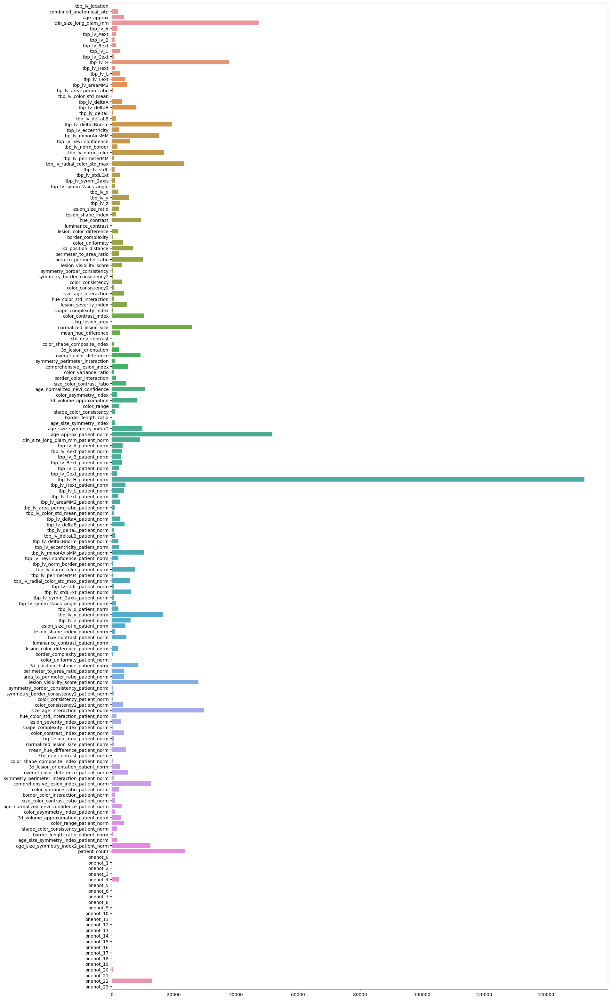

In [55]:
fig, ax = plt.subplots(1,1 , figsize=(20, 40))
sns.barplot(x=lgb_model['classifier'].feature_importances_, y=X_res.drop(['isic_id', 'patient_id', 'target'], axis=1).columns, ax=ax)

<Axes: >

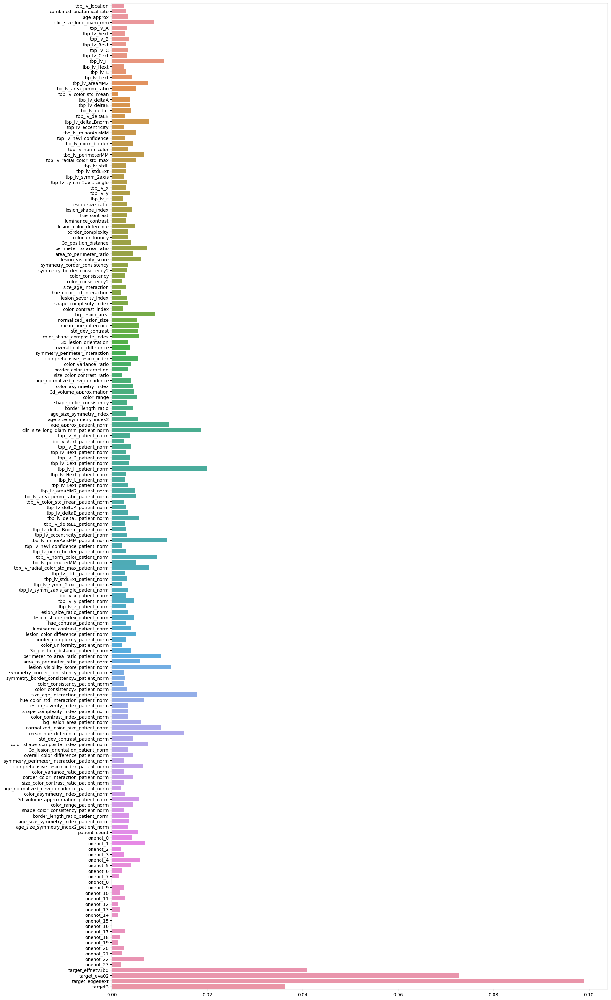

In [77]:
fig, ax = plt.subplots(1,1 , figsize=(20, 40))
sns.barplot(x=xgb_model['classifier'].feature_importances_, y=X_res.drop(['isic_id', 'patient_id', 'target'], axis=1).columns, ax=ax)

In [99]:
#Optfeature_name_imizing Models
import optuna

In [100]:
#     lgb_param_space = {
#         'boosting_type': 'gbdt',
#         'metric': 'cross_entropy',
#         'objective': 'binary',
#         'importance_type':'gain',
#         'subsample_freq': 10,
#         'verbosity':-1,
#         'random_state': 42,
#         'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 12, ),
#         'num_leaves': trial.suggest_int('num_leaves', 10, 200),
#         'max_depth': trial.suggest_int('max_depth', 2, 7),
#         'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.01),
#         'n_estimators': trial.suggest_int('n_estimators', 100, 400),
#         'subsample': trial.suggest_float('subsample', 0.7, 1.0),
#         'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 5.0),
#         'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 5.0),
#         'min_child_samples':trial.suggest_int('min_child_samples', 10, 120),
#     }

In [90]:
def objective(trial, X, y):
#     lgb_param_space = {
#         'boosting_type': 'gbdt',
#         'metric': 'cross_entropy',
#         'objective': 'binary',
#         'importance_type':'gain',
#         'subsample_freq': 10,
#         'verbosity':-1,
#         'random_state': 42,
#         'n_jobs':-1,
#         'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 12, ),
#         'num_leaves': trial.suggest_int('num_leaves', 10, 200),
#         'max_depth': trial.suggest_int('max_depth', 2, 7),
#         'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.01),
#         'n_estimators': trial.suggest_int('n_estimators', 100, 400),
#         'subsample': trial.suggest_float('subsample', 0.7, 1.0),
#         'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 5.0),
#         'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 5.0),
#         'min_child_samples':trial.suggest_int('min_child_samples', 10, 120),
#     }
    
    
#     xgb_params={  
#         'objective':'binary:logistic',
#         'verbosity':0,
#         'n_estimators':trial.suggest_int('n_estimators', 100, 400),
#         'eta':trial.suggest_float('learning_rate', 0.001, 0.01),
#         'max_depth':trial.suggest_int('max_depth', 2, 7),
#         'subsample':trial.suggest_float('subsample', 0.7, 1.0),
#         'colsample_bytree': trial.suggest_float('colsample_bytree',0.3, 1.0),
#         'colsample_bylevel': trial.suggest_float('colsample_bylevel',0.3, 1.0),
#         'colsample_bynode': trial.suggest_float('colsample_bynode',0.3, 1.0),
#         'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 5.0),
#         'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 5.0),
#         'max_leaves': trial.suggest_int('num_leaves', 10, 200),
#         'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 12),
#         'tree_method':'gpu_hist'
#     }
    
    cbc_params={
        'loss_function':     'Logloss',
        'iterations':        200,
        'verbose':           False,
        'random_state':      42,
        'learning_rate':     trial.suggest_float('learning_rate', 1e-2, 1e-1, log=True),
        'max_depth':         trial.suggest_int('max_depth', 4, 8),
        'l2_leaf_reg':       trial.suggest_float('l2_leaf_reg', 1e-3, 10.0, log=True),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.4, 1.0),
        'min_data_in_leaf':  trial.suggest_int('min_data_in_leaf', 5, 100),
        'scale_pos_weight':  trial.suggest_float('scale_pos_weight', 0.8, 4.0),
        'bootstrap_type':    'Bayesian',
    }

#     lgb_model = Pipeline([
#     ('filter', SelectColumns(feature_cols_without_image_cols)),
#     ('classifier', LGBM.LGBMClassifier(**lgb_param_space, feature_col=True)),
#     ])

#     xgb_model = Pipeline([
#         ('classifier', XGB.XGBClassifier(**xgb_params, enable_categorical=True)),
#     ])

    cbc_model = Pipeline([
        ('classifier', CBC.CatBoostClassifier(**cbc_params, cat_features=cat_features)),
    ])

    # Cross-validation setup
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores_test, cv_scores_train = np.empty(5), np.empty(5)
    
    model = cbc_model
    
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y, groups=X_res['patient_id'])):
    
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        model.fit(X_train, y_train)
        
        test_preds = model.predict_proba(X_test)[:, 1]
        #train_preds = model.predict_proba(X_train)[:, 1]
        
        #_, cv_scores_train[idx],_=custom_metric(y_train, train_preds)
        _, cv_scores_test[idx],_ = custom_metric(y_test, test_preds)
    
    return np.mean(cv_scores_test)

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(multivariate=True))
study.optimize(lambda trial: objective(trial, X, Y), n_trials=100)

[I 2024-09-04 18:08:51,824] A new study created in memory with name: no-name-889fe050-3af7-420b-a175-9f0fd7edcae7
[I 2024-09-04 18:09:34,985] Trial 0 finished with value: 0.18847740109494865 and parameters: {'learning_rate': 0.016799768852029127, 'max_depth': 6, 'l2_leaf_reg': 0.0039610841878681274, 'colsample_bylevel': 0.7460796435147882, 'min_data_in_leaf': 35, 'scale_pos_weight': 0.94905852392174}. Best is trial 0 with value: 0.18847740109494865.
[I 2024-09-04 18:10:17,689] Trial 1 finished with value: 0.1881629440228338 and parameters: {'learning_rate': 0.038612216352919754, 'max_depth': 6, 'l2_leaf_reg': 0.22623704970770103, 'colsample_bylevel': 0.8901597078523631, 'min_data_in_leaf': 8, 'scale_pos_weight': 3.049198941818629}. Best is trial 0 with value: 0.18847740109494865.
[I 2024-09-04 18:11:24,637] Trial 2 finished with value: 0.1868771457335569 and parameters: {'learning_rate': 0.018810503926873383, 'max_depth': 7, 'l2_leaf_reg': 0.009504973059038814, 'colsample_bylevel': 0.7

In [124]:
#LGB
study.best_params

{'scale_pos_weight': 6,
 'num_leaves': 18,
 'max_depth': 7,
 'learning_rate': 0.009372258893729307,
 'n_estimators': 360,
 'subsample': 0.9942451998083165,
 'reg_alpha': 3.2200731263500786,
 'reg_lambda': 0.3142282122291396,
 'min_child_samples': 29}

In [67]:
#XGB
study.best_params

{'n_estimators': 375,
 'learning_rate': 0.007865846445129993,
 'max_depth': 6,
 'subsample': 0.8154272143730812,
 'colsample_bytree': 0.4829727276592961,
 'colsample_bylevel': 0.9308080744691895,
 'colsample_bynode': 0.7426129682658317,
 'reg_alpha': 0.8179444170077979,
 'reg_lambda': 2.4056373920594645,
 'num_leaves': 158,
 'scale_pos_weight': 7}

In [121]:
#CAT
study.best_params

{'learning_rate': 0.006142198212674984,
 'l2_leaf_reg': 3,
 'bagging_temperature': 7.551970192952095,
 'depth': 8,
 'min_data_in_leaf': 83.31993795383005,
 'scale_pos_weight': 11.904287537561565}

In [61]:
pareto_trials = study.best_trials

# Print the results
print("Pareto-optimal solutions:")
for trial in pareto_trials:
    print(f"Mean Difference: {trial.values[0]}, PAUC TEST: {trial.values[1]}")
    print(f"Parameters: {trial.params}")

Pareto-optimal solutions:
Mean Difference: 0.004535398345465236, PAUC TEST: 0.18978374391844288
Parameters: {'scale_pos_weight': 1, 'num_leaves': 80, 'max_depth': 3, 'learning_rate': 0.008, 'n_estimators': 400, 'subsample': 0.7, 'reg_alpha': 0.2, 'reg_lambda': 1.0, 'min_child_samples': 90}
Mean Difference: 0.0008097637957835135, PAUC TEST: 0.1866372699620839
Parameters: {'scale_pos_weight': 1, 'num_leaves': 50, 'max_depth': 1, 'learning_rate': 0.007, 'n_estimators': 350, 'subsample': 0.7999999999999999, 'reg_alpha': 0.4, 'reg_lambda': 0.6000000000000001, 'min_child_samples': 20}
Mean Difference: 0.00038746883391610476, PAUC TEST: 0.16347624588873697
Parameters: {'scale_pos_weight': 1, 'num_leaves': 40, 'max_depth': 1, 'learning_rate': 0.002, 'n_estimators': 150, 'subsample': 0.8999999999999999, 'reg_alpha': 0.6000000000000001, 'reg_lambda': 1.0, 'min_child_samples': 10}
Mean Difference: 0.0009681938133613843, PAUC TEST: 0.18812012886995974
Parameters: {'scale_pos_weight': 1, 'num_leave

In [53]:
X_full_data, Y_full_data = df_trans_train.drop(['target'], axis=1), df_trans_train['target']

In [54]:
y_val_proba = estimator.predict(X_full_data)

In [55]:
y_val_proba

array([0., 0., 0., ..., 0., 0., 0.])

In [56]:
# y_val_proba=np.array(y_val_proba)

In [57]:
# max_score, threshold=optimize_threshold(Y_full_data, y_val_proba)
# y_pred=[1 if pred>=threshold else 0 for pred in y_val_proba]

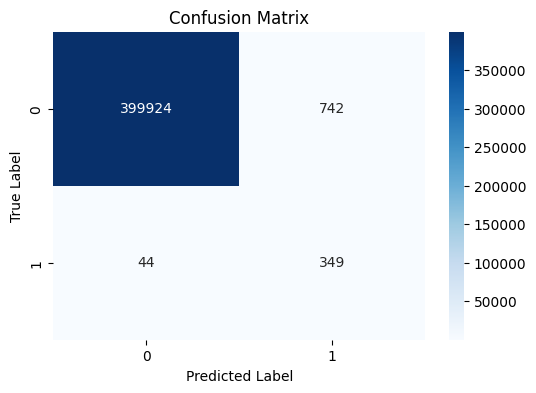

In [58]:
cm = confusion_matrix(Y_full_data, y_val_proba)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.show()

In [99]:
X_test=np.array(df_trans_test.copy())

In [89]:
prediction = lgb.predict_proba(X_test)[:, 1]

In [90]:
prediction

array([0.0401306 , 0.65563292, 0.86156997])

In [91]:
submission = pd.DataFrame(test_data['isic_id'].values, columns=['isic_id'])

In [92]:
submission['target']=prediction

In [93]:
submission

,isic_id,target
0,ISIC_0015657,0.040131
1,ISIC_0015729,0.655633
2,ISIC_0015740,0.861570
